In [1]:
#Import libraries
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()

from sklearn.datasets import load_files       
from keras.utils import np_utils
from keras.preprocessing import image  

from glob import glob

from tqdm import tqdm

Using TensorFlow backend.


In [2]:
# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    files = np.array(data['filenames'])
    targets = np_utils.to_categorical(np.array(data['target']), 3)
    return files, targets

# load train, test, and validation datasets
X_train, y_train = load_dataset('data/train')
X_valid, y_valid = load_dataset('data/valid')
X_test, y_test = load_dataset('data/test')

# load ordered list
anomaly_type = [item[:-1] for item in glob('data/train/*/')]

# print statistics about the dataset
print('There are %d total anomaly categories.' % len(anomaly_type))
print('There are %s total anomaly images.\n' % str(len(X_train) + len(X_valid) + len(X_test)))
print('There are %d training anomaly images.' % len(X_train))
print('There are %d validation anomaly images.' % len(X_valid))
print('There are %d test anomaly images.'% len(X_test))

There are 3 total anomaly categories.
There are 2750 total anomaly images.

There are 2000 training anomaly images.
There are 150 validation anomaly images.
There are 600 test anomaly images.


In [3]:
#define function to show images
def visualize_img(img_path, ax):
    img = cv2.imread(img_path)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
#Load some images
fig = plt.figure(figsize=(20, 10))
for i in range(12):
    ax = fig.add_subplot(3, 4, i + 1, xticks=[], yticks=[])
    visualize_img(train_files[i], ax)

In [4]:
#define functions to transform images into tensors
def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (299, 299, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 299, 299, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [5]:
#load images into memory (If you have at least 32gb of ram. Otherwise, your system will crash in the training.)
#train and test sets
train_tensors = paths_to_tensor(X_train).astype('float32')
valid_tensors = paths_to_tensor(X_valid).astype('float32')

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [00:27<00:00,  5.39it/s]


In [6]:
#test set
test_tensors = paths_to_tensor(X_test).astype('float32')

100%|████████████████████████████████████████████████████████████████████████████████| 600/600 [02:53<00:00,  3.45it/s]


In [8]:
#Generate Image Augmentation.
from keras.preprocessing.image import ImageDataGenerator


#define batch size
batch_size = 50

In [9]:
#define Image Generator for training set
train_datagen = ImageDataGenerator(rescale=1./255,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   rotation_range=90,
                                   shear_range=0.2,
                                   zoom_range=[0.2,1.])

train_generator = train_datagen.flow(x = train_tensors, y = y_train,
                                     batch_size=batch_size)

In [10]:
#define Image Generator for validation and test sets
test_datagen = ImageDataGenerator(rescale=1./255)

In [11]:
validation_generator = test_datagen.flow(x = valid_tensors, y = y_valid,
                                         batch_size=batch_size,
                                         shuffle=False)

In [12]:
test_generator = test_datagen.flow(x = test_tensors, y = y_test,
                                   shuffle=False)

In [13]:
#define the pre-trained model GOOGLE InceptionV3
from keras.applications.inception_v3 import InceptionV3
model = InceptionV3(weights= None, include_top=True, classes= 3, input_shape= (224, 224, 3))


In [14]:
#define model compile
model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [15]:
#define learning rate control
from keras.callbacks import ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)

In [16]:
#dealing with imbalanced dataset
from collections import Counter

#counting number of classes
classes_count = np.array([np.argmax(target) for target in y_train])

#counting number of elements in each class
counter = {}
keys, values = np.unique(classes_count, return_counts=True)
for n, key in enumerate(keys):
    counter[key] = values[n]

#identifying the dominant class
max_val = float(max(counter.values()))       

#defining classes weights
class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}

#defining batches step sizes
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

In [22]:
#model training

#import checkpont
from keras.callbacks import ModelCheckpoint  

#save the best model 
checkpointer = ModelCheckpoint(filepath='saved_models/weights.hdf5', 
                               verbose=1, save_best_only=True)
#define number of epochs
epochs = 100

#fitting and training the model 
model.fit_generator(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=epochs,
                    class_weight=class_weights,
                    validation_data= validation_generator,
                    validation_steps=STEP_SIZE_VALID,
                    verbose=1,                
                    callbacks=[checkpointer, learning_rate_reduction])

Epoch 1/30
40/40 [==============================] - ETA: 35s - loss: 1.8655 - accuracy: 0.420 - ETA: 24s - loss: 1.6936 - accuracy: 0.430 - ETA: 21s - loss: 1.5927 - accuracy: 0.426 - ETA: 19s - loss: 1.6592 - accuracy: 0.455 - ETA: 17s - loss: 1.6454 - accuracy: 0.448 - ETA: 16s - loss: 1.6546 - accuracy: 0.433 - ETA: 16s - loss: 1.6477 - accuracy: 0.451 - ETA: 15s - loss: 1.7091 - accuracy: 0.457 - ETA: 14s - loss: 1.7953 - accuracy: 0.462 - ETA: 13s - loss: 1.8344 - accuracy: 0.476 - ETA: 13s - loss: 1.8223 - accuracy: 0.483 - ETA: 13s - loss: 1.8558 - accuracy: 0.485 - ETA: 12s - loss: 1.8488 - accuracy: 0.489 - ETA: 11s - loss: 1.8636 - accuracy: 0.492 - ETA: 11s - loss: 1.8406 - accuracy: 0.494 - ETA: 10s - loss: 1.8430 - accuracy: 0.495 - ETA: 10s - loss: 1.8472 - accuracy: 0.496 - ETA: 9s - loss: 1.8436 - accuracy: 0.498 - ETA: 9s - loss: 1.8478 - accuracy: 0.50 - ETA: 8s - loss: 1.8610 - accuracy: 0.50 - ETA: 8s - loss: 1.8570 - accuracy: 0.51 - ETA: 7s - loss: 1.8541 - accura

40/40 [==============================] - ETA: 16s - loss: 1.7212 - accuracy: 0.480 - ETA: 15s - loss: 1.6672 - accuracy: 0.550 - ETA: 15s - loss: 1.6606 - accuracy: 0.560 - ETA: 14s - loss: 1.7578 - accuracy: 0.545 - ETA: 14s - loss: 1.7953 - accuracy: 0.564 - ETA: 14s - loss: 1.8728 - accuracy: 0.566 - ETA: 13s - loss: 1.8239 - accuracy: 0.548 - ETA: 13s - loss: 1.7901 - accuracy: 0.535 - ETA: 13s - loss: 1.7848 - accuracy: 0.537 - ETA: 12s - loss: 1.7767 - accuracy: 0.534 - ETA: 12s - loss: 1.8339 - accuracy: 0.525 - ETA: 11s - loss: 1.8657 - accuracy: 0.525 - ETA: 11s - loss: 1.8951 - accuracy: 0.518 - ETA: 10s - loss: 1.8888 - accuracy: 0.512 - ETA: 10s - loss: 1.8755 - accuracy: 0.505 - ETA: 9s - loss: 1.8961 - accuracy: 0.501 - ETA: 9s - loss: 1.8909 - accuracy: 0.49 - ETA: 9s - loss: 1.8881 - accuracy: 0.49 - ETA: 8s - loss: 1.8746 - accuracy: 0.48 - ETA: 8s - loss: 1.8844 - accuracy: 0.48 - ETA: 7s - loss: 1.8887 - accuracy: 0.48 - ETA: 7s - loss: 1.8815 - accuracy: 0.47 - ETA:

40/40 [==============================] - ETA: 17s - loss: 1.8443 - accuracy: 0.520 - ETA: 16s - loss: 1.9676 - accuracy: 0.500 - ETA: 16s - loss: 1.7878 - accuracy: 0.526 - ETA: 15s - loss: 1.8117 - accuracy: 0.550 - ETA: 15s - loss: 1.7960 - accuracy: 0.556 - ETA: 14s - loss: 1.7487 - accuracy: 0.560 - ETA: 14s - loss: 1.7514 - accuracy: 0.565 - ETA: 13s - loss: 1.7284 - accuracy: 0.565 - ETA: 13s - loss: 1.7576 - accuracy: 0.560 - ETA: 13s - loss: 1.7724 - accuracy: 0.548 - ETA: 12s - loss: 1.7332 - accuracy: 0.550 - ETA: 12s - loss: 1.7502 - accuracy: 0.551 - ETA: 11s - loss: 1.7452 - accuracy: 0.543 - ETA: 11s - loss: 1.7476 - accuracy: 0.545 - ETA: 10s - loss: 1.7548 - accuracy: 0.549 - ETA: 10s - loss: 1.7378 - accuracy: 0.550 - ETA: 9s - loss: 1.7424 - accuracy: 0.555 - ETA: 9s - loss: 1.7535 - accuracy: 0.55 - ETA: 9s - loss: 1.7921 - accuracy: 0.54 - ETA: 8s - loss: 1.7915 - accuracy: 0.54 - ETA: 8s - loss: 1.8026 - accuracy: 0.54 - ETA: 7s - loss: 1.8101 - accuracy: 0.54 - ET

40/40 [==============================] - ETA: 16s - loss: 2.0350 - accuracy: 0.440 - ETA: 15s - loss: 1.7369 - accuracy: 0.490 - ETA: 15s - loss: 1.6389 - accuracy: 0.486 - ETA: 14s - loss: 1.6460 - accuracy: 0.475 - ETA: 14s - loss: 1.7429 - accuracy: 0.472 - ETA: 13s - loss: 1.7621 - accuracy: 0.460 - ETA: 13s - loss: 1.7403 - accuracy: 0.474 - ETA: 13s - loss: 1.7705 - accuracy: 0.462 - ETA: 12s - loss: 1.8198 - accuracy: 0.480 - ETA: 12s - loss: 1.8032 - accuracy: 0.488 - ETA: 11s - loss: 1.7854 - accuracy: 0.496 - ETA: 11s - loss: 1.7726 - accuracy: 0.498 - ETA: 11s - loss: 1.7595 - accuracy: 0.501 - ETA: 10s - loss: 1.7297 - accuracy: 0.510 - ETA: 10s - loss: 1.7282 - accuracy: 0.517 - ETA: 9s - loss: 1.7096 - accuracy: 0.522 - ETA: 9s - loss: 1.6961 - accuracy: 0.52 - ETA: 9s - loss: 1.7180 - accuracy: 0.52 - ETA: 8s - loss: 1.6964 - accuracy: 0.52 - ETA: 8s - loss: 1.6944 - accuracy: 0.52 - ETA: 7s - loss: 1.7264 - accuracy: 0.52 - ETA: 7s - loss: 1.7393 - accuracy: 0.52 - ETA:

40/40 [==============================] - ETA: 16s - loss: 1.4365 - accuracy: 0.600 - ETA: 15s - loss: 1.5292 - accuracy: 0.560 - ETA: 15s - loss: 1.4431 - accuracy: 0.586 - ETA: 14s - loss: 1.5776 - accuracy: 0.580 - ETA: 14s - loss: 1.6140 - accuracy: 0.596 - ETA: 14s - loss: 1.6155 - accuracy: 0.600 - ETA: 13s - loss: 1.5895 - accuracy: 0.588 - ETA: 13s - loss: 1.5684 - accuracy: 0.585 - ETA: 12s - loss: 1.6184 - accuracy: 0.577 - ETA: 12s - loss: 1.6172 - accuracy: 0.570 - ETA: 12s - loss: 1.5823 - accuracy: 0.574 - ETA: 11s - loss: 1.6128 - accuracy: 0.575 - ETA: 11s - loss: 1.6017 - accuracy: 0.569 - ETA: 11s - loss: 1.6101 - accuracy: 0.561 - ETA: 10s - loss: 1.5853 - accuracy: 0.568 - ETA: 10s - loss: 1.6158 - accuracy: 0.570 - ETA: 9s - loss: 1.6149 - accuracy: 0.565 - ETA: 9s - loss: 1.6203 - accuracy: 0.56 - ETA: 9s - loss: 1.6313 - accuracy: 0.56 - ETA: 8s - loss: 1.6177 - accuracy: 0.56 - ETA: 8s - loss: 1.6031 - accuracy: 0.56 - ETA: 7s - loss: 1.6265 - accuracy: 0.56 - ET

40/40 [==============================] - ETA: 15s - loss: 1.3903 - accuracy: 0.620 - ETA: 15s - loss: 1.5853 - accuracy: 0.550 - ETA: 15s - loss: 1.7208 - accuracy: 0.586 - ETA: 14s - loss: 1.7522 - accuracy: 0.580 - ETA: 14s - loss: 1.7240 - accuracy: 0.576 - ETA: 14s - loss: 1.7832 - accuracy: 0.573 - ETA: 13s - loss: 1.7438 - accuracy: 0.585 - ETA: 13s - loss: 1.7017 - accuracy: 0.580 - ETA: 13s - loss: 1.6888 - accuracy: 0.588 - ETA: 12s - loss: 1.6751 - accuracy: 0.598 - ETA: 12s - loss: 1.6594 - accuracy: 0.596 - ETA: 11s - loss: 1.6419 - accuracy: 0.595 - ETA: 11s - loss: 1.6557 - accuracy: 0.583 - ETA: 10s - loss: 1.6393 - accuracy: 0.595 - ETA: 10s - loss: 1.6241 - accuracy: 0.593 - ETA: 10s - loss: 1.6388 - accuracy: 0.595 - ETA: 9s - loss: 1.6281 - accuracy: 0.590 - ETA: 9s - loss: 1.6583 - accuracy: 0.58 - ETA: 8s - loss: 1.6694 - accuracy: 0.58 - ETA: 8s - loss: 1.6596 - accuracy: 0.58 - ETA: 7s - loss: 1.6571 - accuracy: 0.58 - ETA: 7s - loss: 1.6518 - accuracy: 0.58 - ET

40/40 [==============================] - ETA: 15s - loss: 1.5815 - accuracy: 0.520 - ETA: 16s - loss: 1.4901 - accuracy: 0.580 - ETA: 15s - loss: 1.4718 - accuracy: 0.580 - ETA: 15s - loss: 1.5442 - accuracy: 0.550 - ETA: 15s - loss: 1.5906 - accuracy: 0.580 - ETA: 14s - loss: 1.5598 - accuracy: 0.580 - ETA: 13s - loss: 1.6523 - accuracy: 0.562 - ETA: 13s - loss: 1.6003 - accuracy: 0.580 - ETA: 13s - loss: 1.5925 - accuracy: 0.584 - ETA: 12s - loss: 1.6008 - accuracy: 0.584 - ETA: 12s - loss: 1.6179 - accuracy: 0.585 - ETA: 11s - loss: 1.5939 - accuracy: 0.586 - ETA: 11s - loss: 1.5998 - accuracy: 0.580 - ETA: 10s - loss: 1.5962 - accuracy: 0.570 - ETA: 10s - loss: 1.5805 - accuracy: 0.570 - ETA: 10s - loss: 1.6225 - accuracy: 0.570 - ETA: 9s - loss: 1.6096 - accuracy: 0.580 - ETA: 9s - loss: 1.6189 - accuracy: 0.57 - ETA: 8s - loss: 1.6006 - accuracy: 0.57 - ETA: 8s - loss: 1.5991 - accuracy: 0.57 - ETA: 7s - loss: 1.5951 - accuracy: 0.58 - ETA: 7s - loss: 1.5946 - accuracy: 0.57 - ET

40/40 [==============================] - ETA: 15s - loss: 1.6125 - accuracy: 0.720 - ETA: 15s - loss: 1.5428 - accuracy: 0.680 - ETA: 15s - loss: 1.4617 - accuracy: 0.626 - ETA: 14s - loss: 1.5966 - accuracy: 0.635 - ETA: 14s - loss: 1.5641 - accuracy: 0.636 - ETA: 14s - loss: 1.5488 - accuracy: 0.643 - ETA: 13s - loss: 1.4927 - accuracy: 0.645 - ETA: 13s - loss: 1.5387 - accuracy: 0.642 - ETA: 13s - loss: 1.5135 - accuracy: 0.635 - ETA: 12s - loss: 1.5064 - accuracy: 0.636 - ETA: 12s - loss: 1.4738 - accuracy: 0.640 - ETA: 11s - loss: 1.4568 - accuracy: 0.638 - ETA: 11s - loss: 1.4671 - accuracy: 0.632 - ETA: 10s - loss: 1.4789 - accuracy: 0.635 - ETA: 10s - loss: 1.4816 - accuracy: 0.636 - ETA: 10s - loss: 1.4916 - accuracy: 0.635 - ETA: 9s - loss: 1.5150 - accuracy: 0.632 - ETA: 9s - loss: 1.5178 - accuracy: 0.62 - ETA: 8s - loss: 1.5210 - accuracy: 0.62 - ETA: 8s - loss: 1.5126 - accuracy: 0.61 - ETA: 7s - loss: 1.5056 - accuracy: 0.62 - ETA: 7s - loss: 1.5103 - accuracy: 0.62 - ET

In [23]:
#loading model weights
model.load_weights('saved_models/weights.hdf5')

In [24]:
#making predictions
predictions = model.predict(test_generator, verbose = 1)

#transforming targets and prediction into numpy array
preds = np.array(np.argmax(predictions, axis = 1))
targets = np.array(np.argmax(y_test, axis = 1))

19/19 [==============================] - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - 1s 75ms/step


In [25]:
#printing confusion matrix
from sklearn.metrics import confusion_matrix 
print(confusion_matrix(targets, preds))

[[ 42  25  50]
 [110 176 107]
 [ 12   7  71]]


In [26]:
from sklearn.metrics import classification_report
y_true = targets
y_pred = preds
target_names = ['Melanoma', 'Nevus', 'Seborrheic Keratosis']
print(classification_report(y_true, y_pred, target_names=target_names))


                      precision    recall  f1-score   support

            Melanoma       0.26      0.36      0.30       117
               Nevus       0.85      0.45      0.59       393
Seborrheic Keratosis       0.31      0.79      0.45        90

            accuracy                           0.48       600
           macro avg       0.47      0.53      0.44       600
        weighted avg       0.65      0.48      0.51       600



In [29]:
#joing targets and predictions into one array
newarr = np.append(arr = np.round(predictions, 3), values = targets.reshape(600,1), axis = 1)

In [30]:
#creating a data frame
df = pd.DataFrame(newarr)

In [31]:
#basic statistics
df.describe()

,0,1,2,3
count,600.000000,600.000000,600.000000,600.000000
mean,0.286115,0.367620,0.346267,0.955000
std,0.183984,0.204223,0.280008,0.586129
min,0.004000,0.052000,0.000000,0.000000
25%,0.114000,0.204000,0.097750,1.000000
50%,0.280000,0.333500,0.285500,1.000000
75%,0.430500,0.494000,0.558250,1.000000
max,0.722000,0.967000,0.943000,2.000000


In [32]:
#filtering melanona
melanoma = df[(df[3]==0)]

#melanona basic statistics
melanoma.describe()

,0,1,2,3
count,117.000000,117.000000,117.000000,117.0
mean,0.321077,0.319077,0.359786,0.0
std,0.177600,0.176937,0.263276,0.0
min,0.006000,0.062000,0.000000,0.0
25%,0.173000,0.192000,0.126000,0.0
50%,0.330000,0.291000,0.311000,0.0
75%,0.459000,0.404000,0.557000,0.0
max,0.692000,0.949000,0.932000,0.0


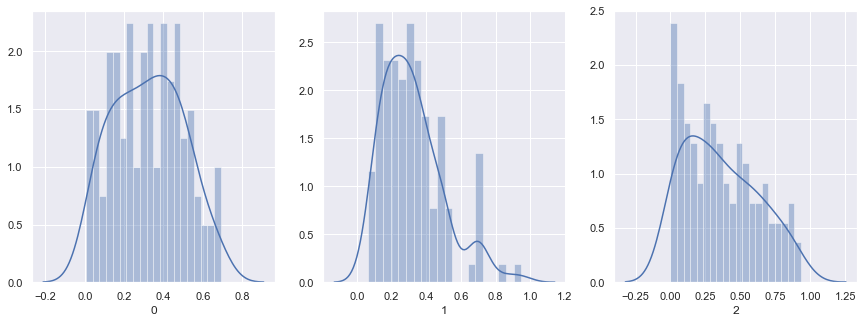

In [33]:
#distplot melanoma
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(melanoma[col],20)

In [34]:
#filtering postive melanonas
pos_melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)==0)]

#melanona basic statistics
pos_melanoma.describe()

,0,1,2,3
count,42.000000,42.000000,42.000000,42.0
mean,0.503476,0.320786,0.175762,0.0
std,0.091994,0.075420,0.114639,0.0
min,0.346000,0.171000,0.010000,0.0
25%,0.428250,0.269000,0.075750,0.0
50%,0.499500,0.317500,0.180500,0.0
75%,0.558250,0.376750,0.263000,0.0
max,0.692000,0.490000,0.385000,0.0


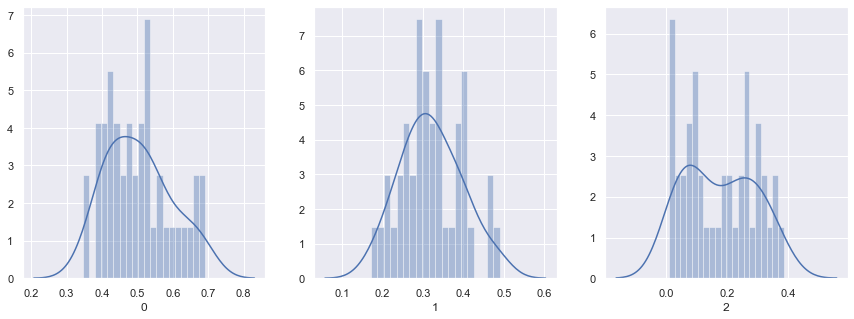

In [38]:
#distplot pos_melanoma
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(pos_melanoma[col],20)

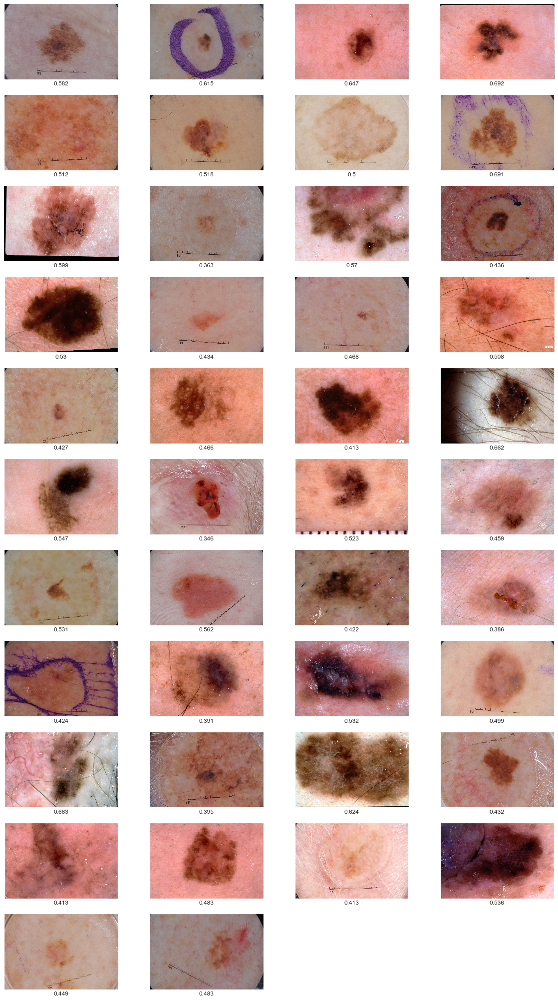

In [35]:
#ploting all positive for melanoma
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(pos_melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(pos_melanoma[0][i],3))
    visualize_img(X_test[i], ax)

In [41]:
#Nevus
nevus = df[(df[3]==1)]

#basic statistics
nevus.describe()

,0,1,2,3
count,393.000000,393.000000,393.000000,393.0
mean,0.302430,0.418712,0.278875,1.0
std,0.179755,0.203165,0.251519,0.0
min,0.005000,0.056000,0.000000,1.0
25%,0.140000,0.252000,0.069000,1.0
50%,0.306000,0.406000,0.201000,1.0
75%,0.437000,0.550000,0.415000,1.0
max,0.722000,0.967000,0.939000,1.0


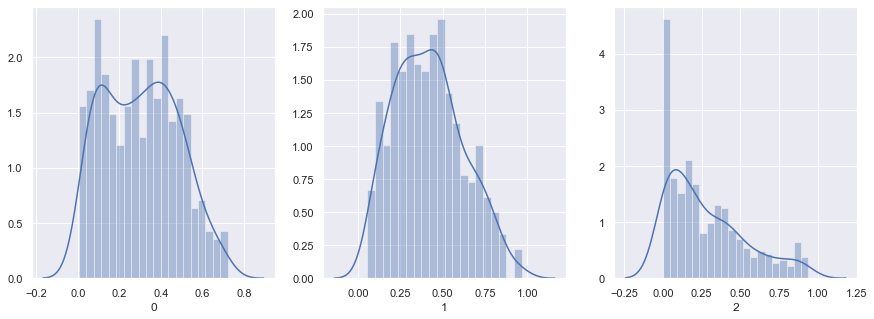

In [40]:
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(nevus[col],20)

In [43]:
#Positive for Nevus
pos_nevus = df[(df[3]==1) & (df.drop(3, axis = 1).idxmax(axis=1)==1)]

#basic statistics
pos_nevus.describe()

,0,1,2,3
count,176.000000,176.000000,176.000000,176.0
mean,0.252153,0.597347,0.150534,1.0
std,0.130383,0.137293,0.126027,0.0
min,0.033000,0.343000,0.000000,1.0
25%,0.124250,0.493750,0.033000,1.0
50%,0.263000,0.566500,0.144500,1.0
75%,0.355250,0.699000,0.223500,1.0
max,0.497000,0.967000,0.460000,1.0


In [46]:
#Seborrheic Keratosis
seborrheic_keratosis = df[(df[3]==2)]

#basic statistics
seborrheic_keratosis.describe()

,0,1,2,3
count,90.000000,90.000000,90.000000,90.0
mean,0.169422,0.207622,0.622967,2.0
std,0.166862,0.132615,0.246969,0.0
min,0.004000,0.052000,0.018000,2.0
25%,0.049500,0.118500,0.463250,2.0
50%,0.090000,0.163000,0.719000,2.0
75%,0.269000,0.235750,0.811500,2.0
max,0.679000,0.809000,0.943000,2.0


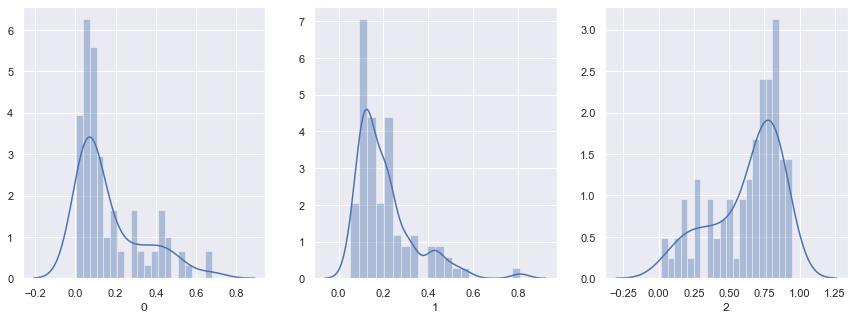

In [47]:
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(seborrheic_keratosis[col],20)

In [48]:
#Positive for Nevus
pos_seborrheic = df[(df[3]==2) & (df.drop(3, axis = 1).idxmax(axis=1)==2)]

#basic statistics
pos_seborrheic.describe()

,0,1,2,3
count,71.000000,71.000000,71.000000,71.0
mean,0.101310,0.167648,0.731042,2.0
std,0.084756,0.084268,0.135042,0.0
min,0.004000,0.052000,0.375000,2.0
25%,0.043000,0.110000,0.663000,2.0
50%,0.076000,0.134000,0.754000,2.0
75%,0.118000,0.211000,0.831000,2.0
max,0.414000,0.436000,0.943000,2.0


In [49]:
#False Negative for Melanoma
neg_melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)!=0)]

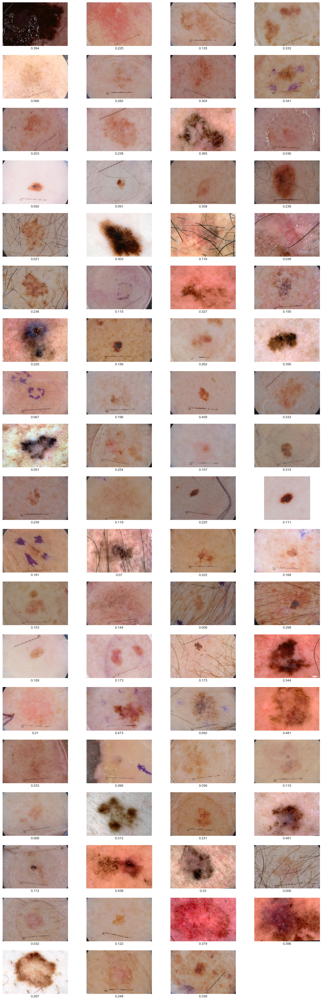

In [50]:
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(neg_melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(neg_melanoma[0][i],3))
    visualize_img(X_test[i], ax)

In [70]:
#Using 20% probability for threshold
melanoma_threshold = df[(df[0]>=0.2)]
people_for_testing = melanoma_threshold[0].count()
print('You need to send {} people for melanoma testing.'.format(people_for_testing))

You need to send 370 people for melanoma testing.


In [66]:
melanoma_threshold = df[(df[0]>=0.2) & (df[3]==0)]
correct = melanoma_threshold[0].count()
print('You have correctly detected {} cases.'.format(correct))

You have correctly detected 83 cases.


In [69]:
#Recall Score at threshold 20%
print('Recall Score =', round(correct/117,3))

Recall Score = 0.709


In [72]:
#Precision Score at threshold 20%
print('Precision Score', round(correct/people_for_testing,3))

Precision Score 0.224
